In [1]:
import numpy as np
import pandas as pd
import vectorbt as vbt
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas_ta as ta
import yfinance as yf 
import warnings
import plotly.graph_objects as go
from plotly.subplots import make_subplots
warnings.filterwarnings('ignore')
plt.style.use('ggplot')
%matplotlib inline

### Load Data

In [2]:
# BTC Full
btc = pd.read_csv('2022.2.9BTCUSDT-H1-NoSession.csv')
btc.Date = btc.Date.astype(str)+' '+ btc.Time
btc.Date = pd.to_datetime(btc.Date)
btc.drop(columns= ['Time'], inplace = True)
btc = btc.set_index('Date')

In [3]:
# EURUSD Full
df = pd.read_csv('2022.2.9EURUSD-H4-NoSession.csv')
df.Date = df.Date.astype(str)+' '+ df.Time
df.Date = pd.to_datetime(df.Date)
df.drop(columns= ['Time'], inplace = True)
df = df.set_index('Date')

##### Trend, Non-Trend Data

In [4]:
dftr1 = pd.read_csv('TRE_EURUSD_2011_2015.csv', index_col = 'Date')
dftr2 = pd.read_csv('TRE_EURUSD_2017_2018.csv', index_col = 'Date')
# ------------------------------------------------------------------
dfsw1 = pd.read_csv('SW_EURUSD_2015_2017_4H.csv', index_col = 'Date')
dfsw2 = pd.read_csv('SW_EURUSD_2010_2014_4H.csv', index_col = 'Date')

### Util Function

In [5]:
#initial
def set_up_df(df:pd.DataFrame , index):  
    df1    =   pd.DataFrame(columns=index)
    df1['date']  =    df.index 
    df1.date = pd.to_datetime(df1.date,format='%Y-%m-%d')
    df1 = df1.set_index('date')
    return df1

#for calculate duration
def convert_to_hours(delta):
    total_seconds = delta.total_seconds()
    hours = str(int(total_seconds // 3600))
    return hours

#Performance Matric
def cal_consecutive(df:pd.DataFrame):
    df['win']= np.sign(df) # assign sign on log
    blocks = df['win'].ne(df['win'].shift()).cumsum() 
    df['consecutive_WL'] = df['win'].groupby(blocks).cumsum()
    return df['consecutive_WL'] 

def Cal_portstat(port):
    port_return = port.total_return().to_frame()
    port_return['MaxDD'] = port.max_drawdown()
    port_return['NumTrade'] = port.trades.count()
    port_return['WinRate'] = port.trades.win_rate()
    port_return['AvgWinningTrade'] = port.trades.winning.returns.mean()
    port_return['AvgLosingTrade'] = port.trades.losing.returns.mean()
    port_return['SharpRatio'] = port.returns_acc.sharpe_ratio()
    return port_return

def Cal_pip(df):
    pip = []
    pipp = df['Avg Exit Price'] - df['Avg Entry Price']
    for i in portfinal['Direction']:
        if i == 'Long':
            pip.append(1)
        else :
            pip.append(-1)    
    return (pip * pipp) 

def Cal_mae_mfe(data,port):
    MAE = []
    MFE = []
    for i,j,y,k in zip(port['Entry Timestamp'], port['Exit Timestamp'], port['Avg Entry Price'], port['Direction']):
        if k == 'Long':
            MFE.append((data.loc[i:j]['High'].max() - y)/y)
            MAE.append((y - df.loc[i:j]['Low'].min())/y)
        else :
            MAE.append((data.loc[i:j]['High'].max() - y)/y)
            MFE.append((y - df.loc[i:j]['Low'].min())/y)
    return MAE, MFE  

def Calkelly(port):
    init_cash = 10000
    W = port.stats()[15]/100
    A = abs(port.stats()[19])
    B = port.stats()[18]
    Percent_kelly = (W/A) - ((1-W)/B)
    riskpertrade = Percent_kelly * init_cash
    print(f'Percent_kelly = {Percent_kelly}')


### Define Strategy Function

In [77]:
def strategy(df):
    df['trix'] = df.ta.trix()['TRIX_30_9']
    df['trixs'] = df.ta.trix(signal = 3)['TRIXs_30_3']
    

    l1 = df['trix'].vbt.crossed_above(df['trixs'])
    df['long_signal'] = l1 

    s1 = df['trix'].vbt.crossed_below(df['trixs'])
    df['short_signal'] = s1 

    df['long_exit'] = s1
    df['short_exit'] = l1

    return df

### Run Default

In [51]:
def run_strategy(df, timeframe = '4h', cash = 10000):
    df = strategy(df)
    port = vbt.Portfolio.from_signals(df.Close,
                                    entries = df['long_signal'],
                                    exits = df['long_exit'],
                                    short_entries = df['short_signal'],
                                    short_exits = df['short_exit'],
                                    freq = timeframe,
                                    init_cash = cash,
                                    fees = 0.00,
                                    slippage = 0.00)
    return port

In [52]:
run_strategy(df).stats()

Start                               2003-05-05 00:00:00
End                                 2022-02-07 20:00:00
Period                               5048 days 00:00:00
Start Value                                     10000.0
End Value                                   13001.80768
Total Return [%]                              30.018077
Benchmark Return [%]                           2.004244
Max Gross Exposure [%]                            100.0
Total Fees Paid                                     0.0
Max Drawdown [%]                              28.597944
Max Drawdown Duration                1841 days 08:00:00
Total Trades                                       1010
Total Closed Trades                                1009
Total Open Trades                                     1
Open Trade PnL                               236.148557
Win Rate [%]                                  37.958375
Best Trade [%]                                 8.917946
Worst Trade [%]                               -2

In [53]:
run_strategy(df).value().vbt.plot()

FigureWidget({
    'data': [{'showlegend': False,
              'type': 'scatter',
              'uid': '16d7b…

### Optimise with SL

In [55]:
def run_strategy_sl(df, timeframe = '4h', cash = 10000, multiply = 1):
    df = strategy(df)
    df['vol'] = df.ta.stdev().ewm(alpha=0.96).mean()
    df['sl_stop'] = (df['vol'] * multiply) / df.Close
    
    port = vbt.Portfolio.from_signals(df.Close,
                                    entries = df['long_signal'],
                                    exits = df['long_exit'] ,
                                    short_entries = df['short_signal'],
                                    short_exits = df['short_exit'],
                                    freq = timeframe,
                                    init_cash = cash,
                                    fees = 0.00, sl_stop = df['sl_stop'],
                                    slippage = 0.00)
    return port

# Optimise Vol Multiply
portstats = []
start, end, step = (0.1, 4, 0.1)
array = np.arange(start,end,step)
for i in array:
    port = run_strategy_sl(df, multiply = i)
    portstats.append(port.stats())
pd.DataFrame(portstats).sort_values('Sharpe Ratio',ascending=False).head(5)   

,Start,End,Period,Start Value,End Value,Total Return [%],Benchmark Return [%],Max Gross Exposure [%],Total Fees Paid,Max Drawdown [%],...,Avg Winning Trade [%],Avg Losing Trade [%],Avg Winning Trade Duration,Avg Losing Trade Duration,Profit Factor,Expectancy,Sharpe Ratio,Calmar Ratio,Omega Ratio,Sortino Ratio
2,2003-05-05,2022-02-07 20:00:00,5048 days,10000.0,14410.167147,44.101671,2.004244,100.0,0.0,21.344062,...,1.223426,-0.265569,7 days 01:46:24.236453202,0 days 22:00:36.363636363,1.182954,4.169285,0.406880,0.125416,1.041385,0.589259
3,2003-05-05,2022-02-07 20:00:00,5048 days,10000.0,13979.195743,39.791957,2.004244,100.0,0.0,21.471991,...,1.206346,-0.300454,7 days 01:35:33.936651583,1 days 01:31:56.883116883,1.147549,3.759127,0.361159,0.114182,1.034811,0.525166
1,2003-05-05,2022-02-07 20:00:00,5048 days,10000.0,13046.585078,30.465851,2.004244,100.0,0.0,18.856159,...,1.232035,-0.224755,7 days 02:55:10.344827586,0 days 18:01:52.635379061,1.147165,2.795645,0.326014,0.102965,1.035830,0.472294
13,2003-05-05,2022-02-07 20:00:00,5048 days,10000.0,14127.995674,41.279957,2.004244,100.0,0.0,23.431663,...,1.227602,-0.573372,7 days 12:10:20.307692307,2 days 05:55:47.770700636,1.099726,4.062322,0.309417,0.107981,1.023363,0.450224
12,2003-05-05,2022-02-07 20:00:00,5048 days,10000.0,14065.842538,40.658425,2.004244,100.0,0.0,23.925244,...,1.231294,-0.557508,7 days 11:42:00,2 days 03:11:28.401253918,1.097179,3.977420,0.307669,0.104387,1.023590,0.447551


In [57]:
run_strategy_sl(df, multiply = 0.3).stats()

Start                               2003-05-05 00:00:00
End                                 2022-02-07 20:00:00
Period                               5048 days 00:00:00
Start Value                                     10000.0
End Value                                  14410.167147
Total Return [%]                              44.101671
Benchmark Return [%]                           2.004244
Max Gross Exposure [%]                            100.0
Total Fees Paid                                     0.0
Max Drawdown [%]                              21.344062
Max Drawdown Duration                1439 days 16:00:00
Total Trades                                        996
Total Closed Trades                                 995
Total Open Trades                                     1
Open Trade PnL                               261.728235
Win Rate [%]                                   20.40201
Best Trade [%]                                 8.917946
Worst Trade [%]                               -1

In [58]:
run_strategy_sl(df, multiply = 0.3).value().vbt.plot()

FigureWidget({
    'data': [{'showlegend': False,
              'type': 'scatter',
              'uid': 'f0d1b…

### Strategy test with Trend Period

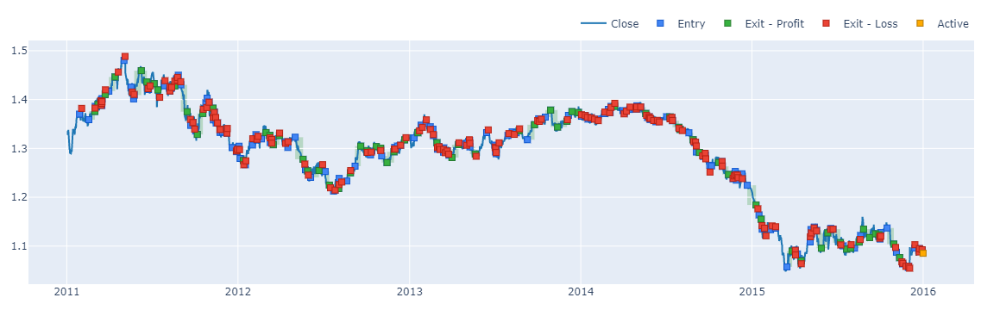

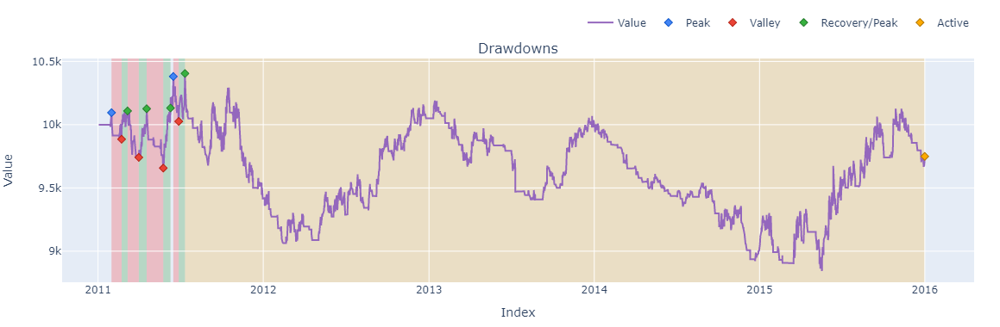

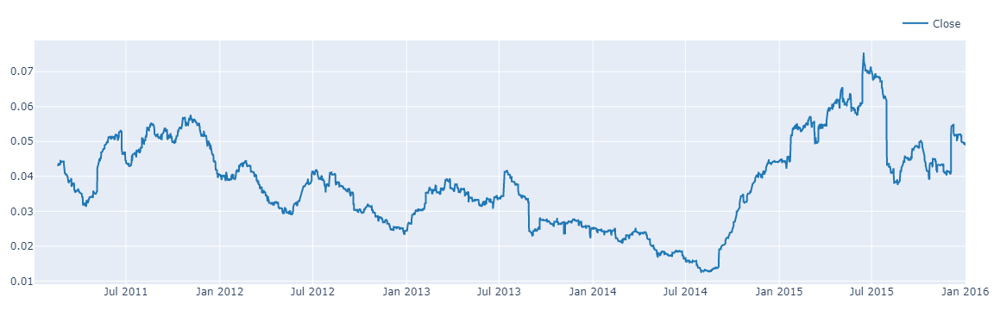

In [73]:
dftr1 = strategy(dftr1)
fig = dftr1.Close.vbt.plot(trace_kwargs=dict(name='Close'))
run_strategy_sl(dftr1).positions.plot(close_trace_kwargs=dict(visible=False), fig=fig)
fig.show()
run_strategy_sl(dftr1).plot(subplots=['drawdowns']).show()
(np.log(dftr1.Close/dftr1.Close.shift(1)).rolling(200).std()*252**.5).ewm(alpha=0.96).mean().vbt.plot().show() # Volatility

####  Trend Data 2

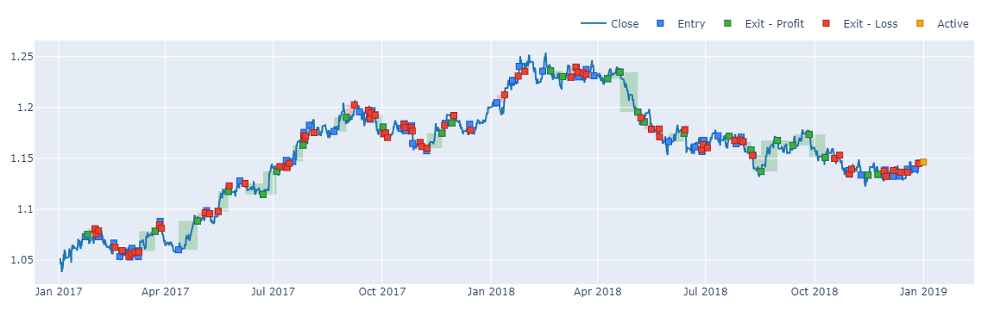

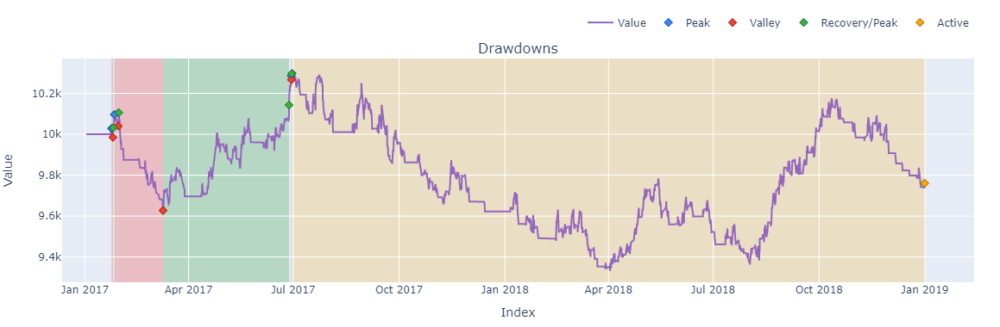

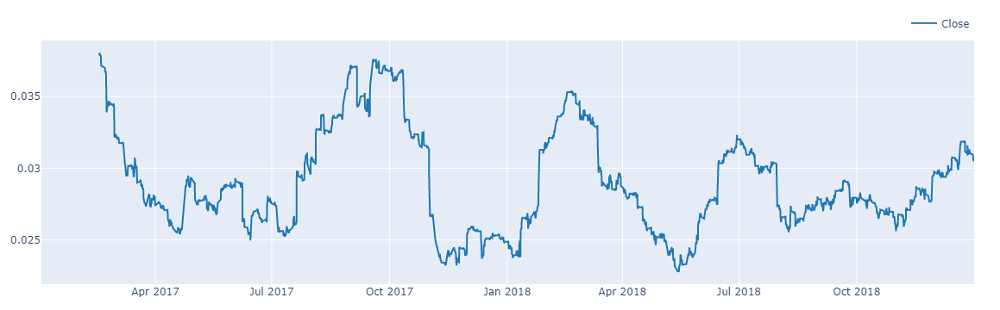

In [74]:
dftr2 = strategy(dftr2)
fig = dftr2.Close.vbt.plot(trace_kwargs=dict(name='Close'))
run_strategy_sl(dftr2).positions.plot(close_trace_kwargs=dict(visible=False), fig=fig)
fig.show()
run_strategy_sl(dftr2).plot(subplots=['drawdowns']).show()
(np.log(dftr2.Close/dftr2.Close.shift(1)).rolling(200).std()*252**.5).ewm(alpha=0.96).mean().vbt.plot().show() # Volatility

### Strategy test with non-Trend Period

####  Non-Trend Data 1

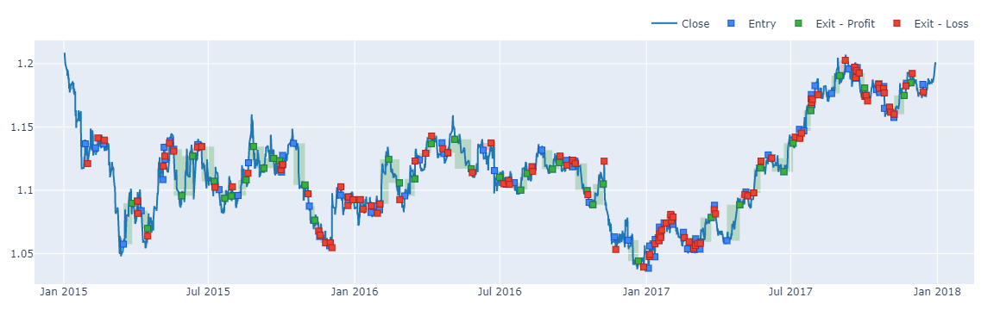

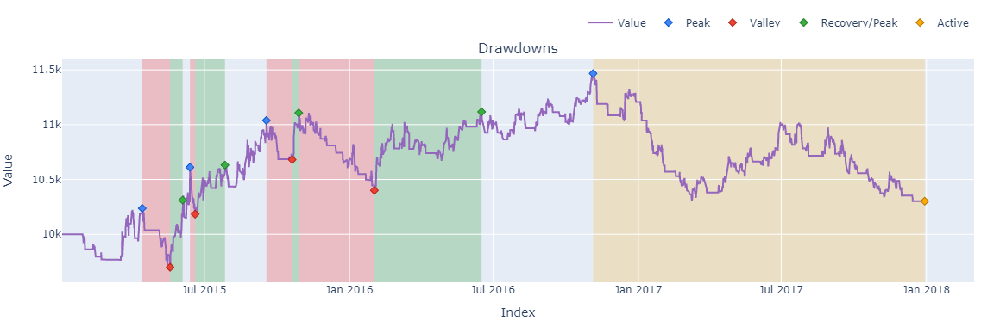

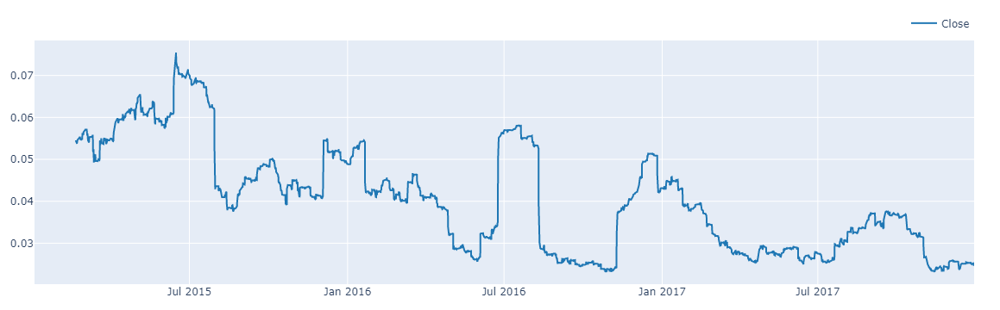

In [75]:
dfsw1 = strategy(dfsw1)
fig = dfsw1.Close.vbt.plot(trace_kwargs=dict(name='Close'))
run_strategy_sl(dfsw1).positions.plot(close_trace_kwargs=dict(visible=False), fig=fig)
fig.show()
run_strategy_sl(dfsw1).plot(subplots=['drawdowns']).show()
(np.log(dfsw1.Close/dfsw1.Close.shift(1)).rolling(200).std()*252**.5).ewm(alpha=0.96).mean().vbt.plot().show() # Volatility

####  Non-Trend Data 2

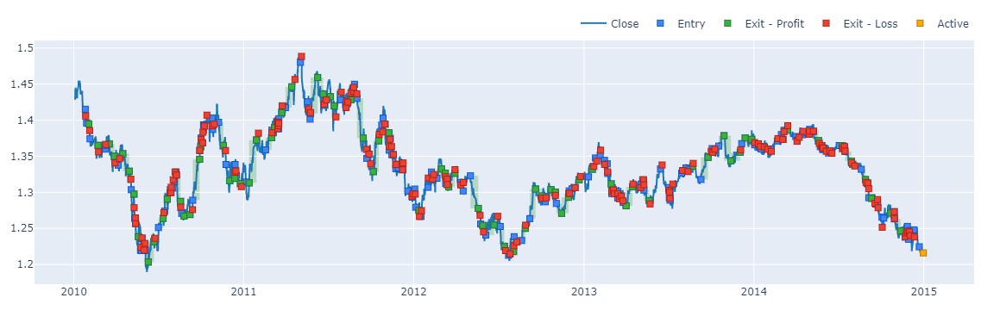

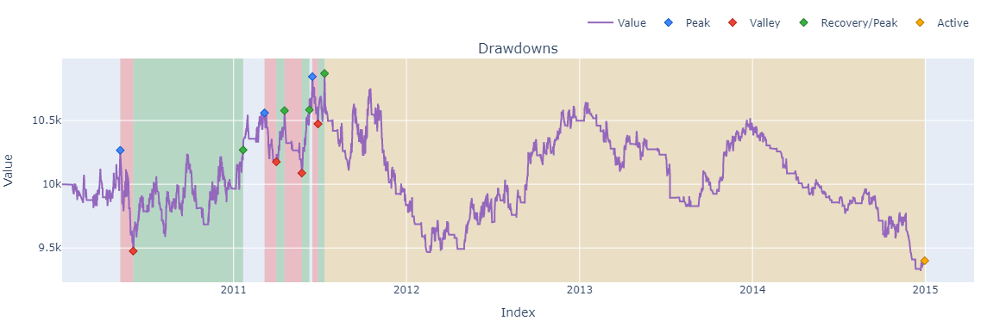

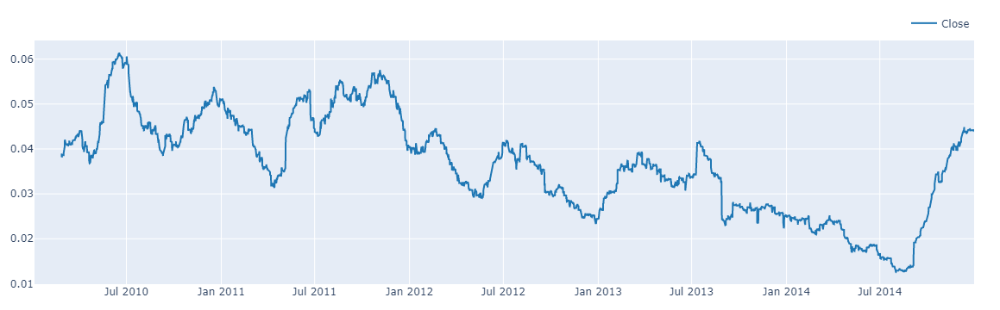

In [76]:
dfsw2 = strategy(dfsw2)
fig = dfsw2.Close.vbt.plot(trace_kwargs=dict(name='Close'))
run_strategy_sl(dfsw2).positions.plot(close_trace_kwargs=dict(visible=False), fig=fig)
fig.show()
run_strategy_sl(dfsw2).plot(subplots=['drawdowns']).show()
(np.log(dfsw2.Close/dfsw2.Close.shift(1)).rolling(200).std()*252**.5).ewm(alpha=0.96).mean().vbt.plot().show() # Volatility